<a href="https://colab.research.google.com/github/IrfanCamparaGithub/DataMiningProj1/blob/main/DataMiningProject2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Introducing the Data and Introducing the Problem**

Hello. My name is Irfan Campara and this is my project 2 for data mining. This project will focus on using classification models, namely support vector machines, random forest, naive bayes and k nearest neighbors classifier. The dataset that I have chosen for this project is a publically available kaggle dataset that contrains data points of obesity levels from countries such as Mexico, Peru and Columbia. The dataset that link is here: https://www.google.com/url?q=https%3A%2F%2Fwww.kaggle.com%2Fdatasets%2Fruchikakumbhar%2Fobesity-prediction. There are many features that are included within the dataset and I will go over each one.
Features within the dataset:


1.   Gender: gender of the patient male/female (M/F)
2.   Age: The age of the patient (integer value)
3.   Height: The height of the patient measured within meteres (float value)
4.   Weight: The weight of the patient measured within kgs (float value)
5.   Family_History: yes/no answer depending on if a patient has a family member that has suffered from being overweight (True, False)
6.   FAVC: Does the patient eat high calorie foods often (True, False)
7.   FCVC: How many meals that the patient eat contain vegetables (integer value)
8.   NCP: The number of meals that a patient has daily (integer value)
9.   CAEC: Wether or not the patient snacks between meals (sometimes, no, frequenyly, always)
10.  SMOKE: Does the patient smoke or not (True, False)
11.  CH2O: The amount of water the patient drinks daily
12.  SCC: Does the patient measure their calories (True, False)
13.  FAF: Daily amount of workouts for patient (integer value)
14.  TUE: How many hours does the patient spend on technology (integer value)
15.  CALC: Wether or not the patient drinks alcohol (sometimes, no, frequenyly, always)
16.  MTRANS: What method of transportation does the patient usually take (public transport, automobile, walking, motorbike, bike)
17. Obesity_level: Wether or not the patient is obecity and on what scale (obesity type 1, obesity type 2, obesity type 3, overweight level 1, overweight lebel 2, normal, insuficient weight)

Problem:
The main problem that I want to solve within this project is being able to very accuractly classify someone as obese. The current bmi scale we use today for measuring obesity can often be wrong with professional football players coming up as high risk individuals when they are in the best shape they could ever be. I also would like to create a system that could be used down the line for patients who are interested in seeing if they are obese and to what extent by answering certain questions (smoking, height, weight etc). The main questions I'm trying to find answers to mainly for this topic is what factors most often classify someone as obese and are there relationships between these features that may indicate a link to obesity. I also want to explore questions for machine learning models themselves as I have learned the theory but I truly want to explore 4 classifiers and see which one performs the best based on a variety of metrics (accuracy, recall, confusion matrix etc). The final question I will be answering for myself and this project is how can I improve the hyperparameters of these classification models in order to properly improve the models and maybe even increase the performance of a model that was iniatally performing unwell. There are many possible questions to be answered within this lab so LETS GET STARTED!! Data from Ruchika Kumbhar



In [ ]:
import pandas as pd
import sklearn as sk
import matplotlib.pyplot as plt
import kagglehub
import seaborn as sns


path = kagglehub.dataset_download("ruchikakumbhar/obesity-prediction")

print("Path to dataset files:", path)

Path to dataset files: /root/.cache/kagglehub/datasets/ruchikakumbhar/obesity-prediction/versions/1


In the code cell above I'm simply importing various libraries that I will need mainly for data processing and manipulation (pandas), future machine learning model libraries (sklearn), graphing libraries (matplotlib, seaborn) and finally importing the dataset through kaggle python library.

In the code cell below I'm simply reading the csv of the dataset and printing out the dataframe so I can get a rough understanding of the data I'm working with.

In [ ]:
df = pd.read_csv('/root/.cache/kagglehub/datasets/ruchikakumbhar/obesity-prediction/versions/1/Obesity prediction.csv')
df

,Gender,Age,Height,Weight,family_history,FAVC,FCVC,NCP,CAEC,SMOKE,CH2O,SCC,FAF,TUE,CALC,MTRANS,Obesity
0,Female,21.000000,1.620000,64.000000,yes,no,2.0,3.0,Sometimes,no,2.000000,no,0.000000,1.000000,no,Public_Transportation,Normal_Weight
1,Female,21.000000,1.520000,56.000000,yes,no,3.0,3.0,Sometimes,yes,3.000000,yes,3.000000,0.000000,Sometimes,Public_Transportation,Normal_Weight
2,Male,23.000000,1.800000,77.000000,yes,no,2.0,3.0,Sometimes,no,2.000000,no,2.000000,1.000000,Frequently,Public_Transportation,Normal_Weight
3,Male,27.000000,1.800000,87.000000,no,no,3.0,3.0,Sometimes,no,2.000000,no,2.000000,0.000000,Frequently,Walking,Overweight_Level_I
4,Male,22.000000,1.780000,89.800000,no,no,2.0,1.0,Sometimes,no,2.000000,no,0.000000,0.000000,Sometimes,Public_Transportation,Overweight_Level_II
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2106,Female,20.976842,1.710730,131.408528,yes,yes,3.0,3.0,Sometimes,no,1.728139,no,1.676269,0.906247,Sometimes,Public_Transportation,Obesity_Type_III
2107,Female,21.982942,1.748584,133.742943,yes,yes,3.0,3.0,Sometimes,no,2.005130,no,1.341390,0.599270,Sometimes,Public_Transportation,Obesity_Type_III
2108,Female,22.524036,1.752206,133.689352,yes,yes,3.0,3.0,Sometimes,no,2.054193,no,1.414209,0.646288,Sometimes,Public_Transportation,Obesity_Type_III
2109,Female,24.361936,1.739450,133.346641,yes,yes,3.0,3.0,Sometimes,no,2.852339,no,1.139107,0.586035,Sometimes,Public_Transportation,Obesity_Type_III


In this following codecell I called the describe method on the dataframe. The describe dataframe tells us basic information about the dataset from the overall datapoints (count) to the average, max and min values for every feature within the dataset.

In [ ]:
df.describe()

,Age,Height,Weight,FCVC,NCP,CH2O,FAF,TUE
count,2111.000000,2111.000000,2111.000000,2111.000000,2111.000000,2111.000000,2111.000000,2111.000000
mean,24.312600,1.701677,86.586058,2.419043,2.685628,2.008011,1.010298,0.657866
std,6.345968,0.093305,26.191172,0.533927,0.778039,0.612953,0.850592,0.608927
min,14.000000,1.450000,39.000000,1.000000,1.000000,1.000000,0.000000,0.000000
25%,19.947192,1.630000,65.473343,2.000000,2.658738,1.584812,0.124505,0.000000
50%,22.777890,1.700499,83.000000,2.385502,3.000000,2.000000,1.000000,0.625350
75%,26.000000,1.768464,107.430682,3.000000,3.000000,2.477420,1.666678,1.000000
max,61.000000,1.980000,173.000000,3.000000,4.000000,3.000000,3.000000,2.000000


**Pre-processing the data: Pre-processing is a important step in the steps of data mining and machine learning as your insights and model accuracy are only as good as your data. There are many things I will do to clean my data such as removing null values to ensure visualizations are functional, imputing data if it is missing and many other things to ensure analysis is correct. This dataset is already very clean but I will display my thought process and pre processing steps below**


This codecell below checks if there are any null values within the dataframe. Thankfully there are none as this will mean less pre-processing steps.

In [ ]:
df.isna().any().any()

False

In the following codecell I check the datatype held within each feature as for graphing and future model implementations it will only be helpful to work with numerical values. As we can see several features such as gender, family_history and MTRANS (method of transportation) are string values and will have to be converted before moving forward.

In [ ]:
print(df.dtypes)

Gender             object
Age               float64
Height            float64
Weight            float64
family_history     object
FAVC               object
FCVC              float64
NCP               float64
CAEC               object
SMOKE              object
CH2O              float64
SCC                object
FAF               float64
TUE               float64
CALC               object
MTRANS             object
Obesity            object
dtype: object


In this following codecell I took every feature that was a object/string and replaced it with the .replace() method in order to have numeric representations of the data.
Features affected:family history, FAVC (high caloric foods eaten), SMOKE (patient smoke or not), SCC (does the patient track theur calories), Gender, CALC (alcohol consumption level), CAEC (does the patient snack), Obesity level and MTRANS (Method of transportation).

Most of these replacements/conversions seem relatively easy such as yes being 1 and no being 2, but for certain more complex columns where values such as frequeny and sometimes were used i had to create a numeric scale that was somewhat understandable such as always being 2, frequently being 1 etc. The same was done for obexity level with 4 downwards represting decreased level of obesity, and the method of transportation was random so I assigned values 1-5 for each method just so that they could be used.






In [ ]:
df['family_history'] = df['family_history'].replace({'yes': 1, 'no': 0})
df['FAVC'] = df['FAVC'].replace({'yes': 1, 'no': 0})
df['SMOKE'] = df['SMOKE'].replace({'yes': 1, 'no': 0})
df['SCC'] = df['SCC'].replace({'yes': 1, 'no': 0})
df['Gender'] = df['Gender'].replace({'Male': 1, 'Female': 0})
df['CALC'] = df['CALC'].replace({'Frequently': 1, 'Sometimes': 0, 'no': -1, 'Always': 2})
df['CAEC'] = df['CAEC'].replace({'Frequently': 1, 'Sometimes': 0, 'no': -1, 'Always': 2})
df['Obesity'] = df['Obesity'].replace({'Obesity_Type_III': 4, 'Obesity_Type_II': 3, 'Obesity_Type_I': 2, 'Overweight_Level_II': 1, 'Overweight_Level_I': 0, 'Normal_Weight': -1, 'Insufficient_Weight' : -100})
df['MTRANS'] = df['MTRANS'].replace({'Public_Transportation': 1, 'Automobile': 2, 'Walking': 3, 'Motorbike': 4, 'Bike' : 5})

df


<ipython-input-7-b1d15c24ccb2>:1: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df['family_history'] = df['family_history'].replace({'yes': 1, 'no': 0})
<ipython-input-7-b1d15c24ccb2>:2: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df['FAVC'] = df['FAVC'].replace({'yes': 1, 'no': 0})
<ipython-input-7-b1d15c24ccb2>:3: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior

,Gender,Age,Height,Weight,family_history,FAVC,FCVC,NCP,CAEC,SMOKE,CH2O,SCC,FAF,TUE,CALC,MTRANS,Obesity
0,0,21.000000,1.620000,64.000000,1,0,2.0,3.0,0,0,2.000000,0,0.000000,1.000000,-1,1,-1
1,0,21.000000,1.520000,56.000000,1,0,3.0,3.0,0,1,3.000000,1,3.000000,0.000000,0,1,-1
2,1,23.000000,1.800000,77.000000,1,0,2.0,3.0,0,0,2.000000,0,2.000000,1.000000,1,1,-1
3,1,27.000000,1.800000,87.000000,0,0,3.0,3.0,0,0,2.000000,0,2.000000,0.000000,1,3,0
4,1,22.000000,1.780000,89.800000,0,0,2.0,1.0,0,0,2.000000,0,0.000000,0.000000,0,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2106,0,20.976842,1.710730,131.408528,1,1,3.0,3.0,0,0,1.728139,0,1.676269,0.906247,0,1,4
2107,0,21.982942,1.748584,133.742943,1,1,3.0,3.0,0,0,2.005130,0,1.341390,0.599270,0,1,4
2108,0,22.524036,1.752206,133.689352,1,1,3.0,3.0,0,0,2.054193,0,1.414209,0.646288,0,1,4
2109,0,24.361936,1.739450,133.346641,1,1,3.0,3.0,0,0,2.852339,0,1.139107,0.586035,0,1,4


In this following codecell I check the value of each altered feature from the previous codecell above to ensure the scale is correct and no string values are left

In [ ]:
print(df['family_history'].unique())
print(df['FAVC'].unique())
print(df['SMOKE'].unique())
print(df['SCC'].unique())
print(df['Gender'].unique())
print(df['CALC'].unique())
print(df['CAEC'].unique())
print(df['Obesity'].unique())
print(df['MTRANS'].unique())

[1 0]
[0 1]
[0 1]
[0 1]
[0 1]
[-1  0  1  2]
[ 0  1  2 -1]
[  -1    0    1    2 -100    3    4]
[1 3 2 4 5]


I again print out the datatypes to ensure only numeric values are left

In [ ]:
print(df.dtypes)

Gender              int64
Age               float64
Height            float64
Weight            float64
family_history      int64
FAVC                int64
FCVC              float64
NCP               float64
CAEC                int64
SMOKE               int64
CH2O              float64
SCC                 int64
FAF               float64
TUE               float64
CALC                int64
MTRANS              int64
Obesity             int64
dtype: object


**I have now finished my pre-procesing steps and I will start to visualize the data in order to answer initial questions, understand the data better, this step will be done using seaborn and matplotlib**

**(Storytelling/ Data Visualization)** Visualization 1: Below is a heatmap what I created using seaborn. The numbers within each cell represent the correlation between 2 seperate features that are labeled both on the x and y axis. The colormap chosen represnts darker values with much higher correlations and non correlated values in a much lighter shade. The diagonal line of black boxes with perfect correlation is to be expected as it is assumed a variable is perfectly correlated to iteself. I initially wanted to see the correlations for obesity and it appears the strongest correlators in order goes weight, family history and age. These initial features are of no suprise but it does answer one of my initial questions as what are the main contributers that have high correlations to obesity level. I then went to check what features were mostly closely related to weight, history and age to possibly find loose links to obesity. From the heatmap it appears that family_history again is the most closely related to weight which is iniatally suprising and it only allows family history to be even a stronger link to obesity levels. I was shocked again as I noticed that the value that had highest correlation to family history was weight again which shows that this pair is extremely extremly valuable when determining obesity level. The last observation I found was that the method of transportation is highly correlated to age. This is suprising and this initial visualization has already answered many questions and shown us that family history and weight are the strongest pair when determing obesity, but age and method of transportation both are involved in determining obesity level as well. For modeling this visualization is important as strong correlation as found between height and weight can negatively affect the model performance negatively as colinearity results in reduncant features and overall instability of the model which should be looked at carefully, but the correlations don't seem extremely high so our modeling will progress as normal.

<Axes: >

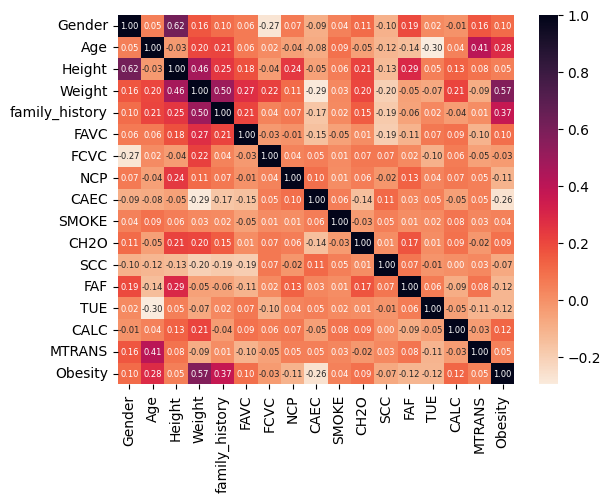

In [ ]:
sns.heatmap(df.corr(), annot=True, cmap='rocket_r', fmt='.2f', annot_kws={"size": 6})

**(Storytelling/ Data Visualization)** Visualization 2: Below is a pairplot for all of the features within the dataset with the all the features layed out and obesity being the hue parameters  the other elements are all color based on obesity. For this pairplot the features can be seen listed both on the x and y axis in order for understanding when looking at each chart within the pairplot. I iniatially wanted to create this visualization so I could get a visual representation of any possible colinearity present within the dataset as this was numerically shown in the previous heatmap but a pairplot can often help with the visual aspect. From the pairplot it is visually able to pick out highly correlated points such as weight and obesity and family_history and obesity but all else is relatively difficult due to the noise often found in pairplots. This plot/visualization mainly reinforces the answers to the same questions answered within the heatmap where I was interested in what are the main contributers that have high correlations to obesity level. Besides that I'm satisfied as the pairplot proved the reinforcement I desired and still shows that the noise dosen't mean that colinearity should be to large of an issue. Time to move on to our models!

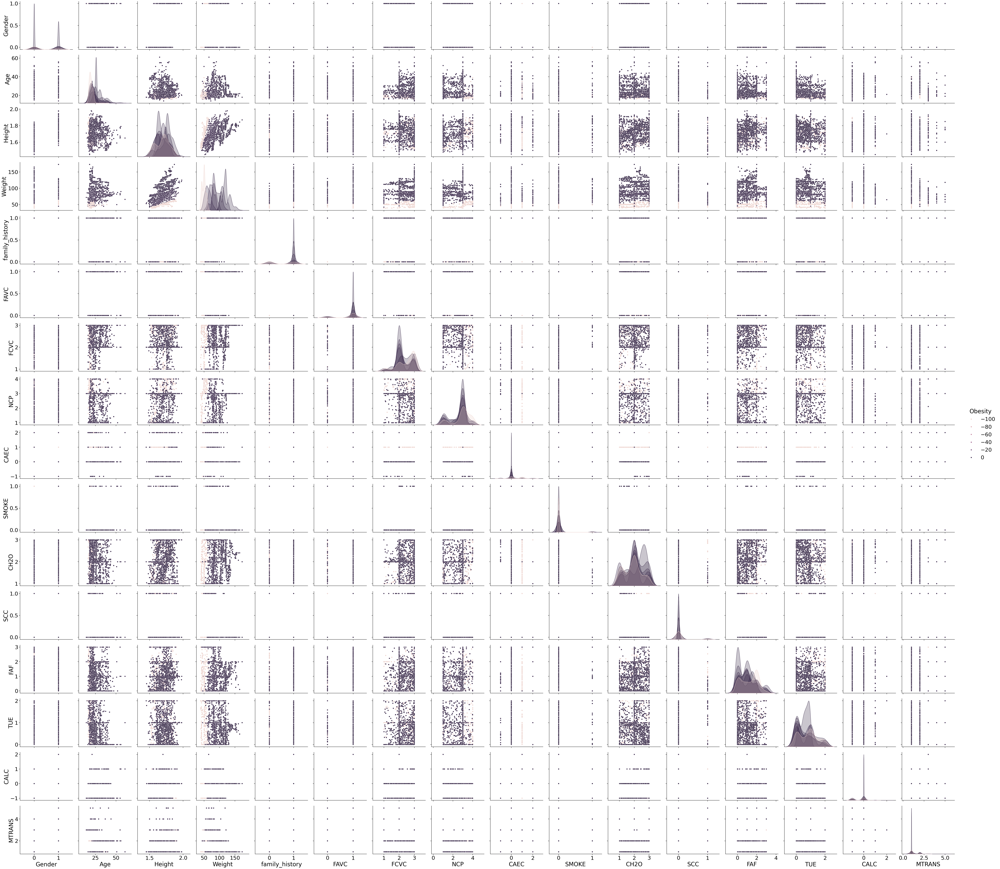

In [ ]:
sns.set_context("notebook", font_scale=2.5)
sns.pairplot(df, hue='Obesity', height = 4, aspect = 1.1)

**Modeling**
The world of machine learning is a vast one and there are many models to use for the purposes of classification but I mainly chose Naive Bayes, Random Forest, K nearest neighbors and support vector machines. I will outline each of the models in more detailw withiun the markdown cells below.

**Naive Bayes Reasoning and Algorithm Description:**

I decided to implement naive bayes within my classification problem as it is a highly popular model that I wanted to explore and I have extensive experience with implementing it, but besides my previous experience, Naive Bayes assumes independence of the features so this is a perfect model to use as a baseline to assume every feature is independent. Naive Bayes essentially is a classifier that uses one main probability formula called Bayes' Theorem which is below.

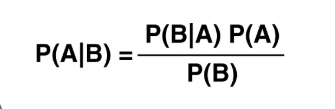

Bayes theorem works by calculating the prosterior probability of each class within the classes for each feature. Again as mentioned the algorithm assumes each feature is independent which is the dangerous part as often times the model can perform poorly with highly correlated features (high colinearity as discussed previously). One of the main pros for Naive bayes however is that it works well with caategorical data and imbalanced datasets. This dataset is not as imbalanced as some out there so naive bayes won't truly shine but will be a great baseline. Overall naive bayes offers a quick and easy to train model but might suffer from existence of correlation between features.

**Random Forest Reasoning And Algorithm Description**

I chose random forst because it was another model that I had experience with and that is extremely powerful. I also chose randomforest due to how strong it is as a algorithm. Random forest is a ensemble learning method that is made up of multiple decision trees that are able to make for a mighty strong model in terms of performance and accuracy. Random forest as stated before works by making up multiple decision trees from subsets of the dataset and combines their predictions to make a even stronger classification accuracy. I will include a photo below of the structure.  


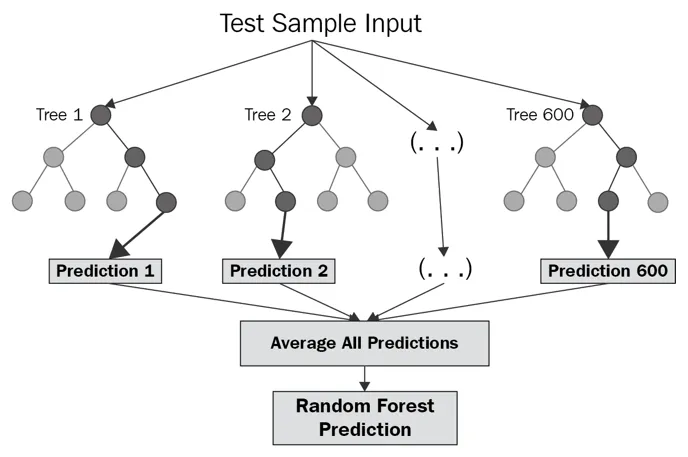

As we have seen random forest is extremely powerful but there are pros and cons as it comes with every machine learning model. The main pros for the random forest algorithm is that it is able to handle non linear data and is unlikely to overfit due to the multiple recursions of decision trees. The main cons for the random forest algorithm is that it can often be computationally intensive and harder to understand visually with the plot_tree() function that exists. Overall random forest algorithm and is one of my favorites and computationally intensive just means don't do the assignment last minute (: .


**Support Vector Machines Reasoning and Algorithm Description**

I chose support vector machines for this model as I wanted to see how strong of a experiment I could devise based on hyperparameter selection as svms can be highly affected by good choices in hyperparameters. Support vector machine is a fundamental classification algorithm that finds specific hyperplanes to seperate different classes. SVMs work by maximising the difference between said classes and uses certain kernel functiona for seperating the data. A image will be included below so SVMs can be visualized. 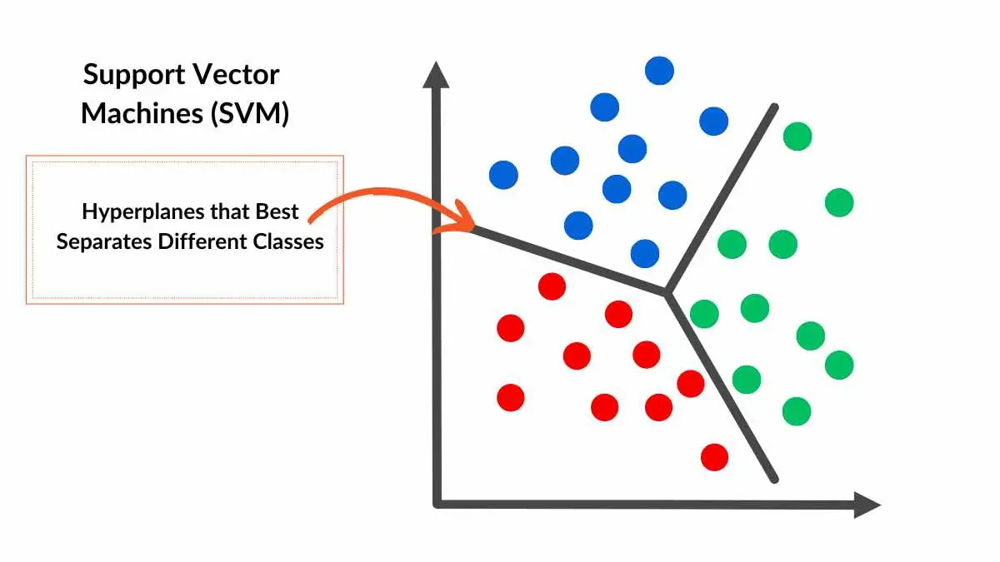


The main pros and cons of support vector machines are that they are very good within high dimensional spaces due to the varying hyperplaes. SVM can be slow to very large datasets and as stated previosuly can be heavily affected by hyperparameter choices making GridSearch a necessity to give each model a fair chance to show their performance. Overall SVM is a great model and will be used below to show how powerful it truly is.


**K Nearest Neighbors  Reasoning and Algorithm Description**

I choce KNN as one of my models as I altered the dataset to be all numerical instead of categorical so this will allow one of knns greatest flaws (categorical data) to be solved and knn is a overall strong dataset as this dataset is not extremely extremely large so it will be able to show it's strong performance without the worry of extremely large datasets hurting the model's performance. KNN essentially works by first choosng a k value which represents the number of closest data points which is often calculated during Euclidian distance, manhattan distance etc. The neighbors are classified based on agreed upon classes. The popular distance formulas for calculating neighbors is below.

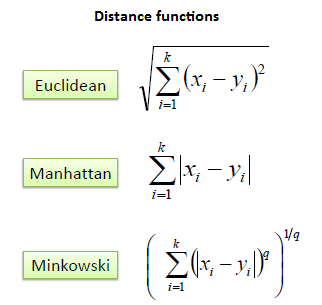


Some of the main pros from KNN are that it is simple and no training phase reduced computational intensity. Some of the main cons are that very large datasets are too intensive for knn, distance metrics can wildly affect classification and the well known curse of dimensionality. I tried to minimize many of knns flaws within my code by choosing a not so large dataset and using Gridsearch to find the best hyperparameters for proper distance metrics. Overall knn is a strong model that is interesting to look at. I will try my best to minimize cons. Time to see how these models perform!

In [ ]:
from sklearn.naive_bayes import GaussianNB
from sklearn.model_selection import train_test_split

nb = GaussianNB()

otherFeatures = df.iloc[:, :-1]
target = df['Obesity']


X_train, X_test, y_train, y_test = train_test_split(otherFeatures, target, test_size=0.2, random_state=0)
nb.fit(X_train, y_train)

train_score = nb.score(X_train, y_train)

test_score = nb.score(X_test, y_test)
print("Train Score: "+ str(train_score))
print("Test Score: " + str(test_score))

Train Score: 0.5930094786729858
Test Score: 0.6099290780141844


In [ ]:
df['Obesity'] = df['Obesity'].replace({'Obesity_Type_III': 4, 'Obesity_Type_II': 3, 'Obesity_Type_I': 2, 'Overweight_Level_II': 1, 'Overweight_Level_I': 0, 'Normal_Weight': -1, 'Insufficient_Weight' : -100})


              precision    recall  f1-score   support

        -100       0.54      0.97      0.69        65
          -1       0.56      0.25      0.34        57
           0       0.56      0.18      0.27        57
           1       0.69      0.16      0.26        55
           2       0.43      0.78      0.56        67
           3       0.68      0.77      0.73        53
           4       0.99      1.00      0.99        69

    accuracy                           0.61       423
   macro avg       0.64      0.59      0.55       423
weighted avg       0.64      0.61      0.56       423



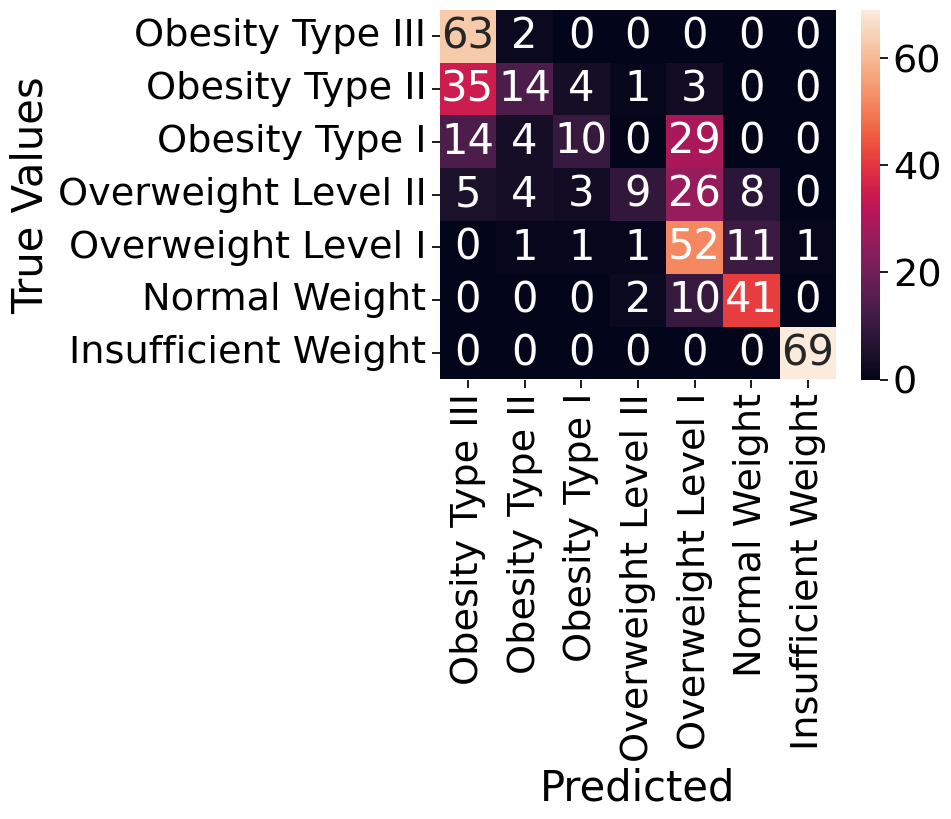

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix

y_pred = nb.predict(X_test)

print(classification_report(y_test, y_pred))
cm = confusion_matrix(y_test, y_pred)
classnames = ['Obesity Type III', 'Obesity Type II', "Obesity Type I", "Overweight Level II", "Overweight Level I", 'Normal Weight', "Insufficient Weight"]
sns.heatmap(cm, annot=True, xticklabels = classnames, yticklabels= classnames)


plt.xlabel('Predicted')
plt.ylabel('True Values')

plt.show()


In [ ]:
from sklearn.model_selection import GridSearchCV


hyper_parameters = {
    'var_smoothing': [1e-9, 1e-6, 1e-5, 1e-3, 1e-1]
}
gridSearch = GridSearchCV(nb, hyper_parameters)
gridSearch.fit(X_train, y_train)
gridSearch.best_params_

{'var_smoothing': 0.001}

In [ ]:
from sklearn.naive_bayes import GaussianNB
nb = GaussianNB(var_smoothing = 0.001)
nb.fit(X_train, y_train)
train_score = nb.score(X_train, y_train)

test_score = nb.score(X_test, y_test)
print("Train Score: "+ str(train_score))
print("Test Score: " + str(test_score))


Train Score: 0.6522511848341233
Test Score: 0.6595744680851063


              precision    recall  f1-score   support

        -100       0.70      0.95      0.81        65
          -1       0.69      0.35      0.47        57
           0       0.63      0.60      0.61        57
           1       0.38      0.51      0.43        55
           2       0.48      0.45      0.46        67
           3       0.97      0.68      0.80        53
           4       0.88      1.00      0.94        69

    accuracy                           0.66       423
   macro avg       0.68      0.65      0.65       423
weighted avg       0.68      0.66      0.65       423



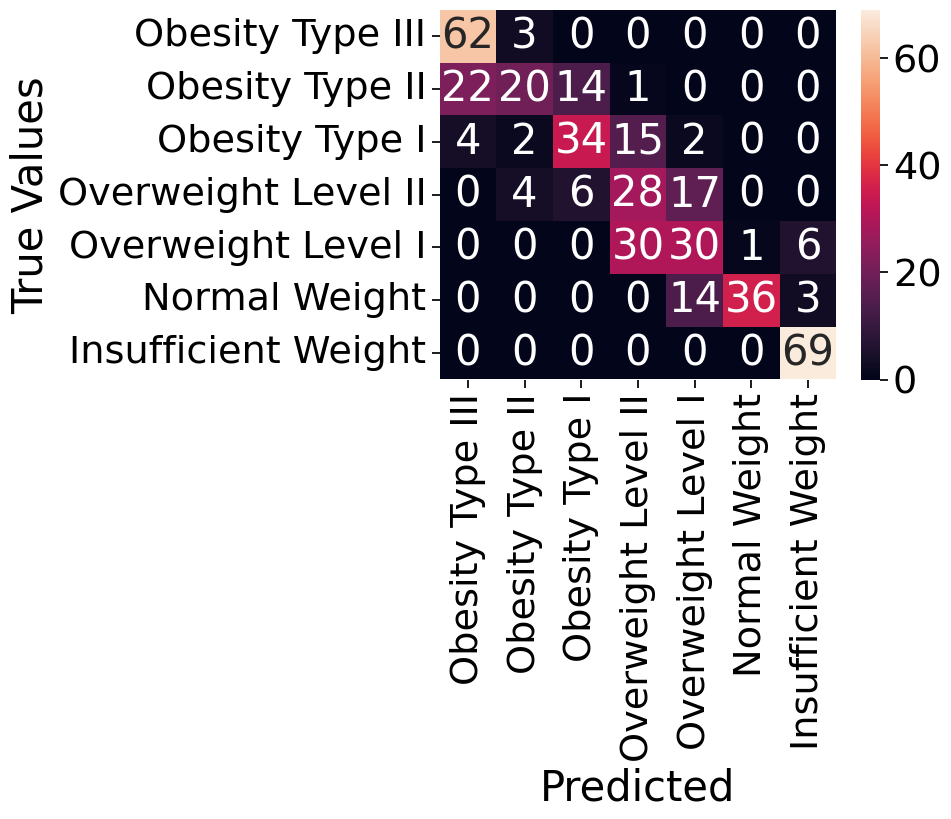

In [ ]:
y_pred = nb.predict(X_test)

print(classification_report(y_test, y_pred))
cm = confusion_matrix(y_test, y_pred)
classnames = ['Obesity Type III', 'Obesity Type II', "Obesity Type I", "Overweight Level II", "Overweight Level I", 'Normal Weight', "Insufficient Weight"]
sns.heatmap(cm, annot=True, xticklabels = classnames, yticklabels= classnames)


plt.xlabel('Predicted')
plt.ylabel('True Values')

plt.show()

In [ ]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import classification_report, confusion_matrix

knn = KNeighborsClassifier()
knn.fit(X_train, y_train)
train_score = knn.score(X_train, y_train)

test_score = knn.score(X_test, y_test)
print("Train Score: "+ str(train_score))
print("Test Score: " + str(test_score))


Train Score: 0.9170616113744076
Test Score: 0.8652482269503546


              precision    recall  f1-score   support

        -100       0.79      1.00      0.88        65
          -1       0.78      0.51      0.62        57
           0       0.80      0.77      0.79        57
           1       0.85      0.82      0.83        55
           2       0.89      0.96      0.92        67
           3       0.96      0.96      0.96        53
           4       0.96      0.99      0.97        69

    accuracy                           0.87       423
   macro avg       0.86      0.86      0.85       423
weighted avg       0.86      0.87      0.86       423



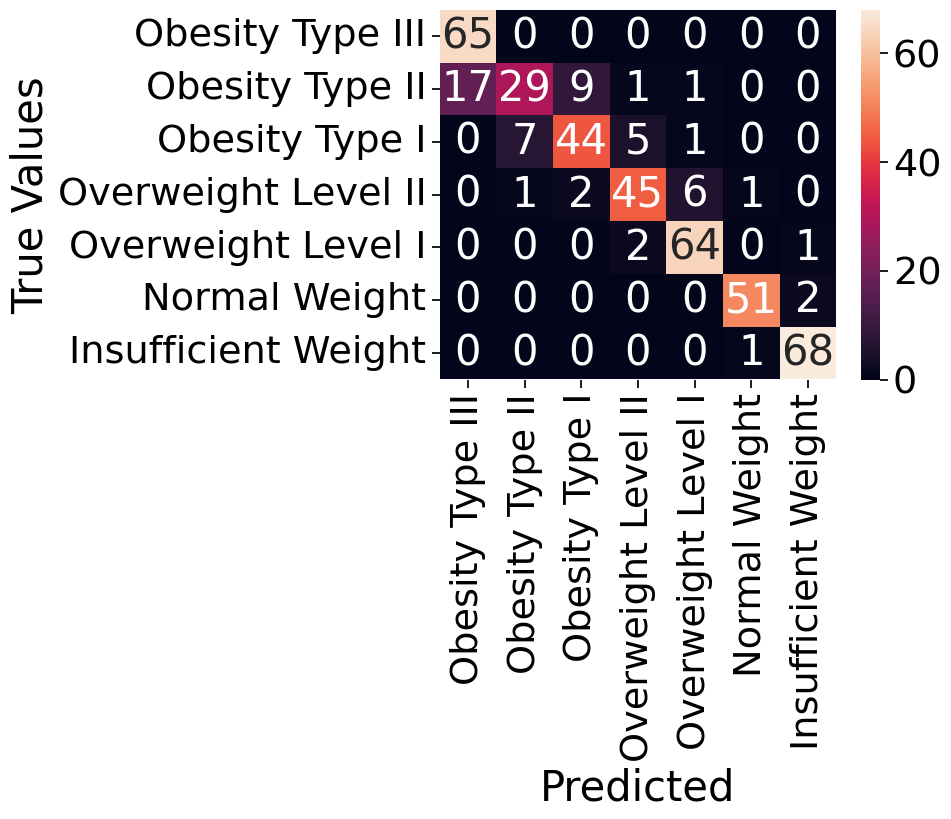

In [ ]:
y_pred = knn.predict(X_test)

print(classification_report(y_test, y_pred))
cm = confusion_matrix(y_test, y_pred)
classnames = ['Obesity Type III', 'Obesity Type II', "Obesity Type I", "Overweight Level II", "Overweight Level I", 'Normal Weight', "Insufficient Weight"]
sns.heatmap(cm, annot=True, xticklabels = classnames, yticklabels= classnames)


plt.xlabel('Predicted')
plt.ylabel('True Values')

plt.show()

In [ ]:
from sklearn.model_selection import GridSearchCV


hyper_parameters = {
    'n_neighbors': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15],
    'weights': ['uniform', 'distance'],
    'metric': ['minkowski', 'euclidean', 'manhattan', 'chebyshev'],
    'algorithm': ['auto', 'ball_tree', 'kd_tree', 'brute'],
}
gridSearch = GridSearchCV(knn, hyper_parameters)
gridSearch.fit(X_train, y_train)
gridSearch.best_params_

{'algorithm': 'auto',
 'metric': 'manhattan',
 'n_neighbors': 1,
 'weights': 'uniform'}

In [ ]:
knn = KNeighborsClassifier(algorithm = 'auto', metric = 'manhattan', n_neighbors = 1, weights = 'uniform')
knn.fit(X_train, y_train)
train_score = knn.score(X_train, y_train)

test_score = knn.score(X_test, y_test)
print("Train Score: "+ str(train_score))
print("Test Score: " + str(test_score))

Train Score: 1.0
Test Score: 0.9314420803782506


              precision    recall  f1-score   support

        -100       0.90      0.95      0.93        65
          -1       0.91      0.68      0.78        57
           0       0.86      0.98      0.92        57
           1       0.93      0.91      0.92        55
           2       0.94      0.97      0.96        67
           3       1.00      1.00      1.00        53
           4       0.99      1.00      0.99        69

    accuracy                           0.93       423
   macro avg       0.93      0.93      0.93       423
weighted avg       0.93      0.93      0.93       423



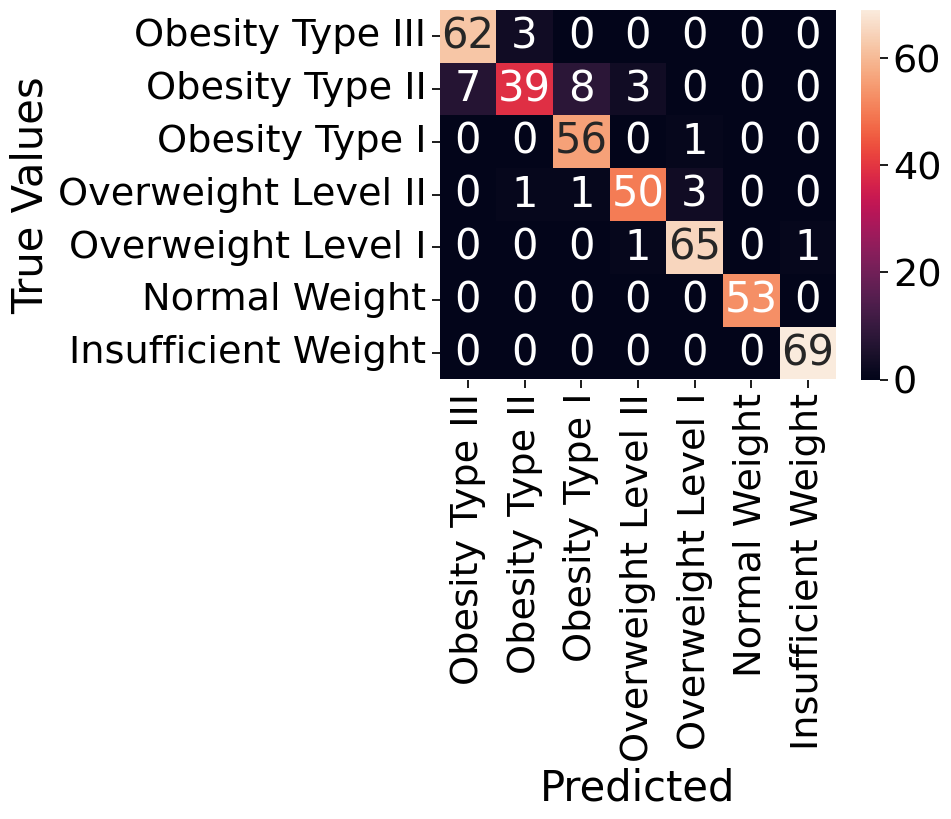

In [ ]:
y_pred = knn.predict(X_test)

print(classification_report(y_test, y_pred))
cm = confusion_matrix(y_test, y_pred)
classnames = ['Obesity Type III', 'Obesity Type II', "Obesity Type I", "Overweight Level II", "Overweight Level I", 'Normal Weight', "Insufficient Weight"]
sns.heatmap(cm, annot=True, xticklabels = classnames, yticklabels= classnames)


plt.xlabel('Predicted')
plt.ylabel('True Values')

plt.show()

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, confusion_matrix

rf = RandomForestClassifier()
rf.fit(X_train, y_train)
train_score = rf.score(X_train, y_train)

test_score = rf.score(X_test, y_test)
print("Train Score: "+ str(train_score))
print("Test Score: " + str(test_score))

Train Score: 1.0
Test Score: 0.9598108747044918


              precision    recall  f1-score   support

        -100       1.00      0.94      0.97        65
          -1       0.83      1.00      0.90        57
           0       0.98      0.86      0.92        57
           1       0.96      0.93      0.94        55
           2       0.97      0.99      0.98        67
           3       1.00      1.00      1.00        53
           4       1.00      1.00      1.00        69

    accuracy                           0.96       423
   macro avg       0.96      0.96      0.96       423
weighted avg       0.96      0.96      0.96       423



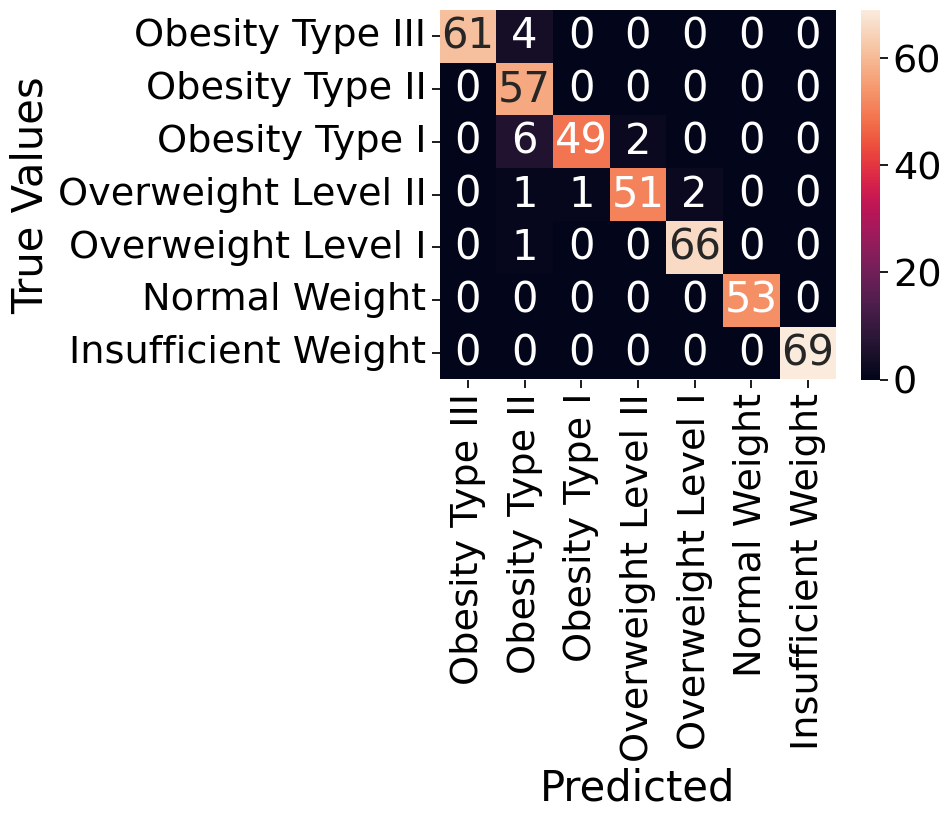

In [ ]:
y_pred = rf.predict(X_test)

print(classification_report(y_test, y_pred))
cm = confusion_matrix(y_test, y_pred)
classnames = ['Obesity Type III', 'Obesity Type II', "Obesity Type I", "Overweight Level II", "Overweight Level I", 'Normal Weight', "Insufficient Weight"]
sns.heatmap(cm, annot=True, xticklabels = classnames, yticklabels= classnames)


plt.xlabel('Predicted')
plt.ylabel('True Values')

plt.show()

In [ ]:
from sklearn.model_selection import GridSearchCV


hyper_parameters = {
    'n_estimators': [50, 100, 200],
    'max_depth': [10,  20, 30],
    'min_samples_leaf': [3, 5, 10],


}
gridSearch = GridSearchCV(rf, hyper_parameters)
gridSearch.fit(X_train, y_train)
gridSearch.best_params_

{'max_depth': 30, 'min_samples_leaf': 3, 'n_estimators': 200}

In [ ]:
rf = RandomForestClassifier(max_depth = 30, min_samples_leaf = 3, n_estimators = 200)
rf.fit(X_train, y_train)
train_score = rf.score(X_train, y_train)

test_score = rf.score(X_test, y_test)
print("Train Score: "+ str(train_score))
print("Test Score: " + str(test_score))

Train Score: 0.990521327014218
Test Score: 0.9598108747044918


              precision    recall  f1-score   support

        -100       1.00      0.95      0.98        65
          -1       0.79      1.00      0.88        57
           0       1.00      0.88      0.93        57
           1       0.98      0.91      0.94        55
           2       0.99      0.99      0.99        67
           3       1.00      0.98      0.99        53
           4       1.00      1.00      1.00        69

    accuracy                           0.96       423
   macro avg       0.97      0.96      0.96       423
weighted avg       0.97      0.96      0.96       423



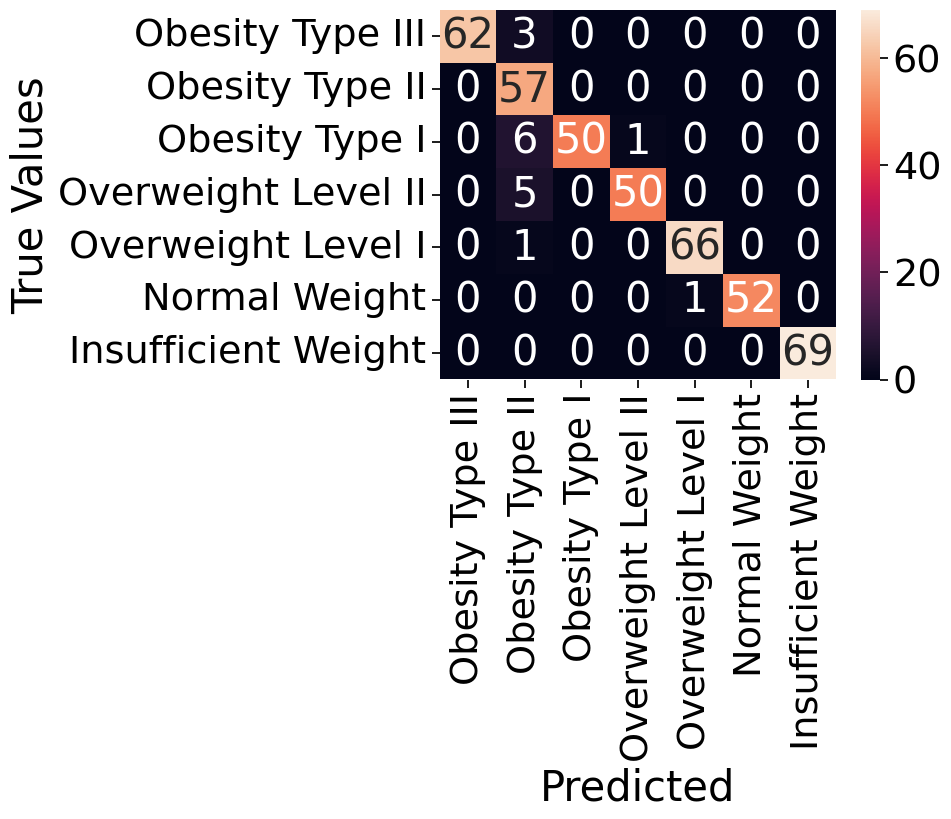

In [ ]:
y_pred = rf.predict(X_test)

print(classification_report(y_test, y_pred))
cm = confusion_matrix(y_test, y_pred)
classnames = ['Obesity Type III', 'Obesity Type II', "Obesity Type I", "Overweight Level II", "Overweight Level I", 'Normal Weight', "Insufficient Weight"]
sns.heatmap(cm, annot=True, xticklabels = classnames, yticklabels= classnames)


plt.xlabel('Predicted')
plt.ylabel('True Values')

plt.show()

In [ ]:
from sklearn.svm import SVC
from sklearn.metrics import classification_report, confusion_matrix

svm = SVC()
svm.fit(X_train, y_train)
train_score = svm.score(X_train, y_train)

test_score = svm.score(X_test, y_test)
print("Train Score: "+ str(train_score))
print("Test Score: " + str(test_score))

Train Score: 0.6220379146919431
Test Score: 0.6217494089834515


              precision    recall  f1-score   support

        -100       0.76      0.83      0.79        65
          -1       0.50      0.49      0.50        57
           0       0.60      0.49      0.54        57
           1       0.37      0.49      0.42        55
           2       0.45      0.39      0.42        67
           3       1.00      0.58      0.74        53
           4       0.79      1.00      0.88        69

    accuracy                           0.62       423
   macro avg       0.64      0.61      0.61       423
weighted avg       0.64      0.62      0.62       423



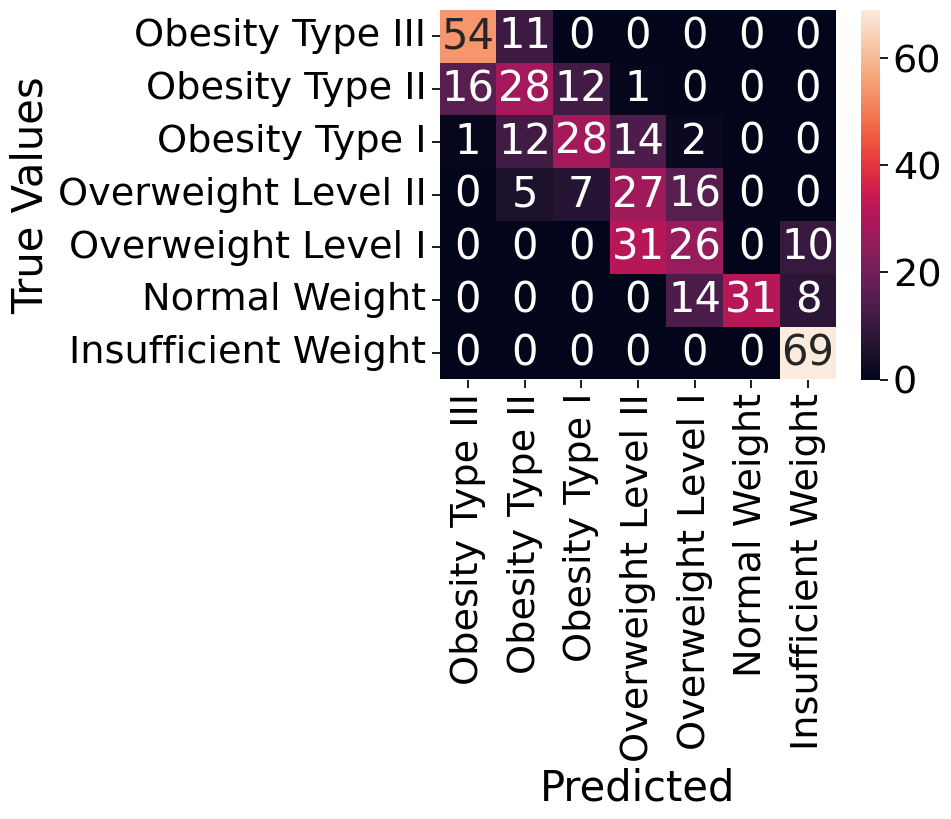

In [ ]:
y_pred = svm.predict(X_test)

print(classification_report(y_test, y_pred))
cm = confusion_matrix(y_test, y_pred)
classnames = ['Obesity Type III', 'Obesity Type II', "Obesity Type I", "Overweight Level II", "Overweight Level I", 'Normal Weight', "Insufficient Weight"]
sns.heatmap(cm, annot=True, xticklabels = classnames, yticklabels= classnames)


plt.xlabel('Predicted')
plt.ylabel('True Values')

plt.show()

In [ ]:
from sklearn.model_selection import GridSearchCV


hyper_parameters = {
    'C':[1, 10, 100],
    'kernel': ['linear', 'rbf', 'poly'],
    'gamma': ['scale', 'auto'],
}
gridSearch = GridSearchCV(svm, hyper_parameters)
gridSearch.fit(X_train, y_train)
gridSearch.best_params_

{'C': 100, 'gamma': 'scale', 'kernel': 'linear'}

In [ ]:
from sklearn.svm import SVC
from sklearn.metrics import classification_report, confusion_matrix

svm = SVC(C = 100, gamma = 'scale', kernel = 'linear')
svm.fit(X_train, y_train)
train_score = svm.score(X_train, y_train)

test_score = svm.score(X_test, y_test)
print("Train Score: "+ str(train_score))
print("Test Score: " + str(test_score))

Train Score: 0.9792654028436019
Test Score: 0.966903073286052


              precision    recall  f1-score   support

        -100       0.94      0.97      0.95        65
          -1       0.93      0.93      0.93        57
           0       0.93      0.93      0.93        57
           1       0.96      0.93      0.94        55
           2       1.00      1.00      1.00        67
           3       1.00      1.00      1.00        53
           4       1.00      1.00      1.00        69

    accuracy                           0.97       423
   macro avg       0.97      0.97      0.97       423
weighted avg       0.97      0.97      0.97       423



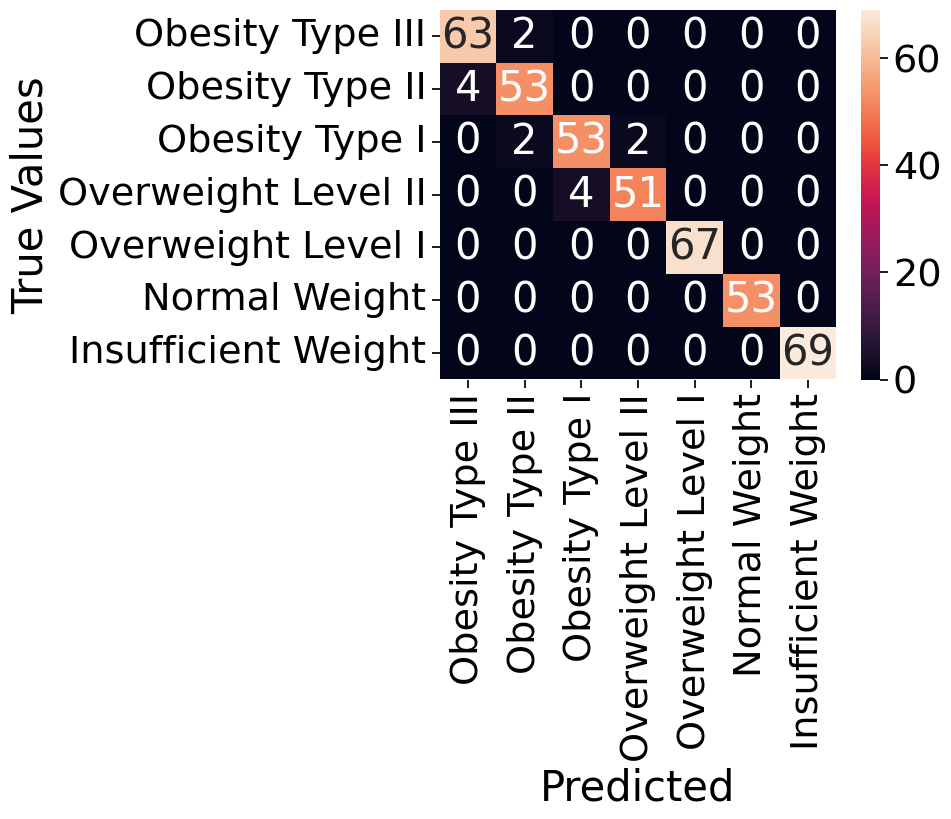

In [ ]:
y_pred = svm.predict(X_test)

print(classification_report(y_test, y_pred))
cm = confusion_matrix(y_test, y_pred)
classnames = ['Obesity Type III', 'Obesity Type II', "Obesity Type I", "Overweight Level II", "Overweight Level I", 'Normal Weight', "Insufficient Weight"]
sns.heatmap(cm, annot=True, xticklabels = classnames, yticklabels= classnames)


plt.xlabel('Predicted')
plt.ylabel('True Values')

plt.show()

links: https://corporatefinanceinstitute.com/resources/data-science/random-forest/

https://www.google.com/url?sa=i&url=https%3A%2F%2Fspotintelligence.com%2F2024%2F05%2F06%2Fsupport-vector-machines-svm%2F&psig=AOvVaw3F6-aTUBVoDkueRBCDu9w8&ust=1740584286210000&source=images&cd=vfe&opi=89978449&ved=0CAMQjB1qFwoTCLjYy_GT34sDFQAAAAAdAAAAABAE


https://www.google.com/search?sca_esv=a8c5a6c4b20ab744&q=euclidean+distance+knn&udm=2&fbs=ABzOT_CWdhQLP1FcmU5B0fn3xuWpA-dk4wpBWOGsoR7DG5zJBtmuEdhfywyzhendkLDnhcq4Fx59GJo42IHin57PCNq1BCLfVKQIWPymDGFj2PR-DaOFXu-BnsGeOvX43fYDTIQk3NefR4EEb-ebM3m4QCHpn8F3hj8loZf8UVS7gA7pesLbGCPGRAGgIdD_aRz5J-MW5r2OoZ_j2z7Hvvawu8qipWEekw&sa=X&ved=2ahUKEwinz4Tnlt-LAxXqM9AFHTKOONAQtKgLegQIERAB&biw=1072&bih=742&dpr=1.25#vhid=DBj8AOXfCoQeQM&vssid=mosaic